In [2]:
import rasterio
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


In [4]:
#Quality Assessment (QA) band–based masking
import numpy as np

# Dummy QA band to demonstrate logic
qa = np.random.randint(0, 4096, (100, 100))  # QA60 is 16-bit

# Bit positions (Sentinel-2 QA60)
cloud_bit  = 1 << 10
cirrus_bit = 1 << 11

qa_mask = ((qa & cloud_bit) == 0) & ((qa & cirrus_bit) == 0)


In [5]:
#Cloud Probability Thresholding
# Simulated cloud probability (0–100%)
cloud_prob = np.random.randint(0, 100, (100, 100))

# Threshold (<10% = clear)
cloud_prob_mask = cloud_prob < 10


In [6]:
#Spectral Threshold Rule-Based Masking
#S2_PreFire.tif
#(or During / Post similarly)
import rasterio
import numpy as np

# Open Sentinel-2 image
with rasterio.open("Fire_Project/S2_PreFire.tif") as src:
    blue = src.read(1).astype(float)   # B2
    red  = src.read(2).astype(float)   # B4
    nir  = src.read(3).astype(float)   # B8



In [7]:
#Temporary NDVI (for cloud detection)
ndvi_temp = (nir - red) / (nir + red + 1e-6)
#Spectral Threshold Cloud Mask
spectral_cloud_mask = (blue < 0.3) & (ndvi_temp > 0.1)
#Apply Mask to Bands (IMPORTANT STEP)
red_masked = np.where(spectral_cloud_mask, red, np.nan)
nir_masked = np.where(spectral_cloud_mask, nir, np.nan)



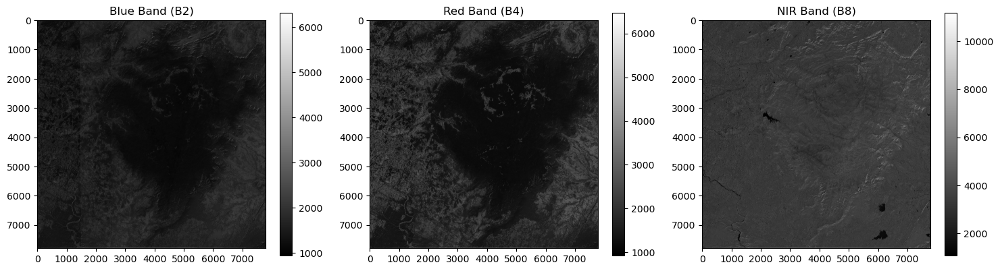

In [8]:
import matplotlib.pyplot as plt

plt.figure(figsize=(15,4))

plt.subplot(1,3,1)
plt.imshow(blue, cmap='gray')
plt.title("Blue Band (B2)")
plt.colorbar()

plt.subplot(1,3,2)
plt.imshow(red, cmap='gray')
plt.title("Red Band (B4)")
plt.colorbar()

plt.subplot(1,3,3)
plt.imshow(nir, cmap='gray')
plt.title("NIR Band (B8)")
plt.colorbar()

plt.tight_layout()
plt.show()


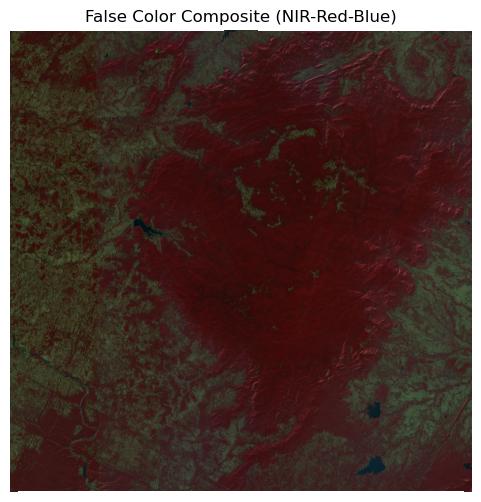

In [9]:
#DISPLAY TRUE COLOR / FALSE COLOR COMPOSITE (VERY IMPORTANT)
# Normalize bands for display
def normalize(band):
    return (band - np.nanmin(band)) / (np.nanmax(band) - np.nanmin(band))

fcc = np.dstack((
    normalize(nir),   # R channel
    normalize(red),   # G channel
    normalize(blue)   # B channel
))

plt.figure(figsize=(6,6))
plt.imshow(fcc)
plt.title("False Color Composite (NIR-Red-Blue)")
plt.axis('off')
plt.show()


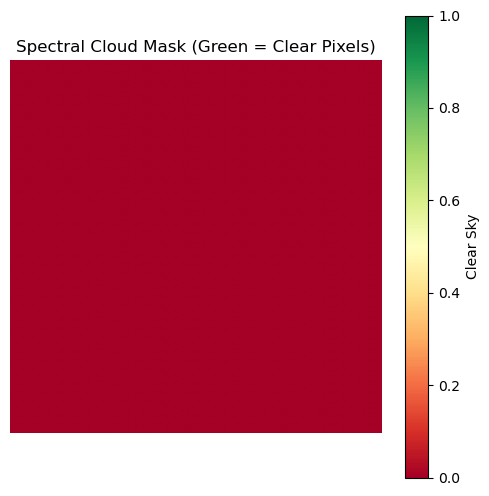

In [11]:
# DISPLAY SPECTRAL CLOUD MASK RESULT
ndvi_temp = (nir - red) / (nir + red + 1e-6)
spectral_cloud_mask = (blue < 0.3) & (ndvi_temp > 0.1)

plt.figure(figsize=(6,6))
plt.imshow(spectral_cloud_mask, cmap='RdYlGn', vmin=0, vmax=1)
plt.title("Spectral Cloud Mask (Green = Clear Pixels)")
plt.colorbar(label='Clear Sky')
plt.axis('off')
plt.savefig('cloud_mask_result.png', dpi=300, bbox_inches='tight')
plt.show()

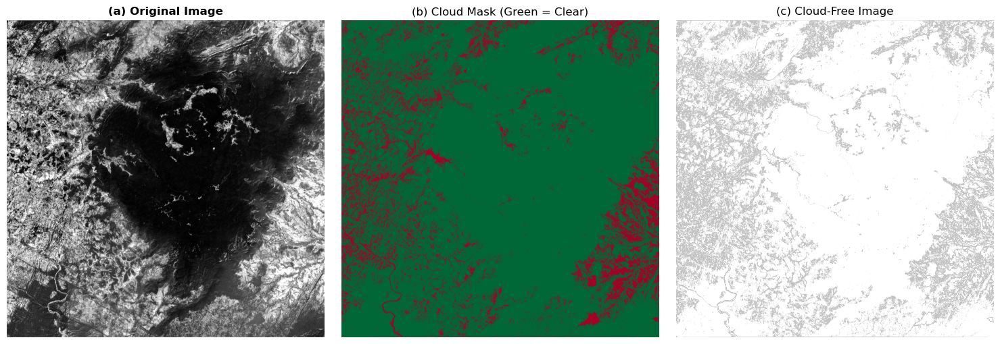

Clear sky pixels: 52898355 (87.0%)
Cloud pixels: 7871459 (13.0%)


In [14]:
# Check your cloud mask logic
ndvi_temp = (nir - red) / (nir + red + 1e-6)

# ORIGINAL (might be inverted):
# spectral_cloud_mask = (blue < 0.3) & (ndvi_temp > 0.1)

# TRY THIS INSTEAD (inverted logic):
spectral_cloud_mask = (blue > 0.3) | (ndvi_temp < 0.1)  # Clouds
clear_sky_mask = ~spectral_cloud_mask  # Clear sky (inverted)

# OR even simpler - just use NDVI threshold:
clear_sky_mask = ndvi_temp > 0.2  # Clear = vegetation present

# Create the figure
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Panel 1: Original Red band
axes[0].imshow(red, cmap='gray', vmin=np.nanpercentile(red, 2), 
               vmax=np.nanpercentile(red, 98))
axes[0].set_title('(a) Original Image', fontsize=12, weight='bold')
axes[0].axis('off')

# Panel 2: Cloud Mask (Green = Clear, Red = Cloud)
axes[1].imshow(clear_sky_mask, cmap='RdYlGn', vmin=0, vmax=1)
axes[1].set_title('(b) Cloud Mask (Green = Clear)', fontsize=12)
axes[1].axis('off')

# Panel 3: Masked Result
red_masked = np.where(clear_sky_mask, red, np.nan)
axes[2].imshow(red_masked, cmap='gray', vmin=0, vmax=0.3)
axes[2].set_title('(c) Cloud-Free Image', fontsize=12)
axes[2].axis('off')

plt.tight_layout()
plt.savefig('cloud_mask_result.png', dpi=300, bbox_inches='tight')
plt.show()

# Check statistics
print(f"Clear sky pixels: {np.sum(clear_sky_mask)} ({np.sum(clear_sky_mask)/clear_sky_mask.size*100:.1f}%)")
print(f"Cloud pixels: {np.sum(~clear_sky_mask)} ({np.sum(~clear_sky_mask)/clear_sky_mask.size*100:.1f}%)")

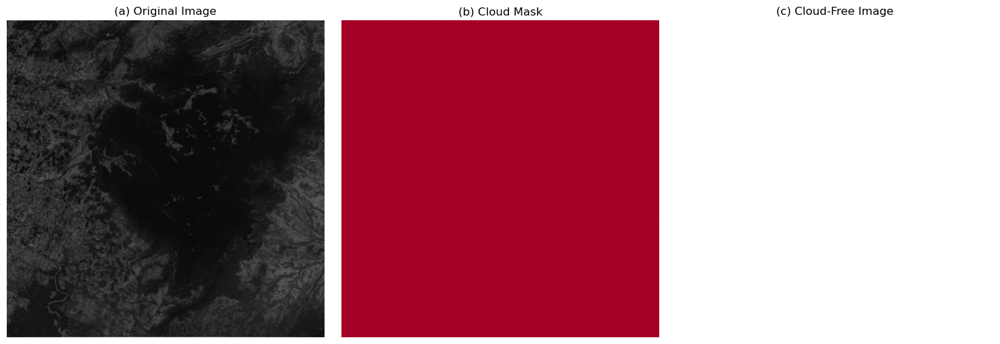

In [12]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Panel 1: Original Red band
axes[0].imshow(red, cmap='gray')
axes[0].set_title('(a) Original Image')
axes[0].axis('off')

# Panel 2: Cloud Mask (fixed)
axes[1].imshow(spectral_cloud_mask, cmap='RdYlGn', vmin=0, vmax=1)
axes[1].set_title('(b) Cloud Mask')
axes[1].axis('off')

# Panel 3: Masked Result
red_masked = np.where(spectral_cloud_mask, red, np.nan)
axes[2].imshow(red_masked, cmap='gray')
axes[2].set_title('(c) Cloud-Free Image')
axes[2].axis('off')

plt.tight_layout()
plt.savefig('cloud_mask_result.png', dpi=300, bbox_inches='tight')
plt.show()

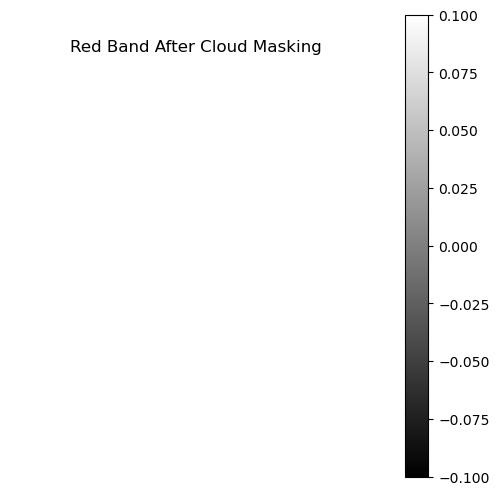

In [13]:
#APPLY MASK AND SHOW CLEANED IMAGE
red_masked = np.where(spectral_cloud_mask, red, np.nan)

plt.figure(figsize=(6,6))
plt.imshow(red_masked, cmap='gray')
plt.title("Red Band After Cloud Masking")
plt.colorbar()
plt.axis('off')
plt.show()


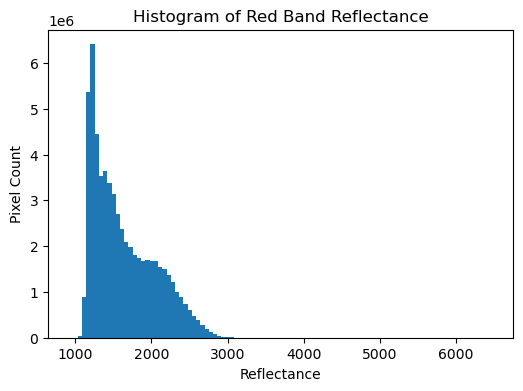

In [14]:
plt.figure(figsize=(6,4))
plt.hist(red[~np.isnan(red)].flatten(), bins=100)
plt.title("Histogram of Red Band Reflectance")
plt.xlabel("Reflectance")
plt.ylabel("Pixel Count")
plt.show()


Pre- processing

1.⁠ ⁠Cloud Masking

In [28]:
import rasterio
import numpy as np

def cloud_mask_and_extract(path):
    with rasterio.open(path) as src:
        blue = src.read(1).astype(float)   # B2
        red  = src.read(2).astype(float)   # B4
        nir  = src.read(3).astype(float)   # B8
        swir = src.read(4).astype(float)   # B11
        meta = src.meta

    # Temporary NDVI (for cloud detection)
    ndvi_temp = (nir - red) / (nir + red + 1e-6)

    # Spectral cloud mask
    spectral_cloud_mask = (blue < 0.3) & (ndvi_temp > 0.1)

    # Apply mask
    red_masked  = np.where(spectral_cloud_mask, red, np.nan)
    nir_masked  = np.where(spectral_cloud_mask, nir, np.nan)
    swir_masked = np.where(spectral_cloud_mask, swir, np.nan)

    return red_masked, nir_masked, swir_masked, meta


In [29]:
red_pre, nir_pre, swir_pre, meta = cloud_mask_and_extract(
    "Fire_Project/S2_PreFire.tif"
)


In [30]:
red_dur, nir_dur, swir_dur, _ = cloud_mask_and_extract(
    "Fire_Project/S2_DuringFire.tif"
)


In [31]:
red_post, nir_post, swir_post, _ = cloud_mask_and_extract(
    "Fire_Project/S2_PostFire.tif"
)


In [32]:
print("Red band shape:", red_dur.shape)
print("NIR band shape:", nir_dur.shape)
print("SWIR band shape:", swir_dur.shape)


Red band shape: (7798, 7793)
NIR band shape: (7798, 7793)
SWIR band shape: (7798, 7793)


In [33]:
blue, red, nir   # OR red_masked, nir_masked if masking applied


(array([[   nan,    nan,    nan, ...,    nan,    nan,    nan],
        [   nan,    nan,    nan, ...,    nan,    nan,    nan],
        [   nan,    nan,    nan, ...,    nan,    nan,    nan],
        ...,
        [1418. , 1420. , 1420. , ..., 1608. , 1532. , 1562. ],
        [1466. , 1467. , 1467. , ..., 1562. , 1525. , 1606. ],
        [1489.5, 1463. , 1463. , ..., 1594. , 1567. , 1521. ]],
       shape=(7798, 7793)),
 array([[   nan,    nan,    nan, ...,    nan,    nan,    nan],
        [   nan,    nan,    nan, ...,    nan,    nan,    nan],
        [   nan,    nan,    nan, ...,    nan,    nan,    nan],
        ...,
        [1633. , 1625. , 1625. , ..., 1512. , 1482. , 1496. ],
        [1701. , 1690.5, 1690.5, ..., 1530. , 1540. , 1518. ],
        [1726. , 1670. , 1670. , ..., 1561. , 1589. , 1571. ]],
       shape=(7798, 7793)),
 array([[   nan,    nan,    nan, ...,    nan,    nan,    nan],
        [   nan,    nan,    nan, ...,    nan,    nan,    nan],
        [   nan,    nan,    nan, .

In [35]:
s2_images = {
    "Pre-Fire": "/Users/pragya/Documents/Similipal_Project/Fire_Project/S2_PreFire.tif",
    "During-Fire": "/Users/pragya/Documents/Similipal_Project/Fire_Project/S2_DuringFire.tif",
    "Post-Fire": "/Users/pragya/Documents/Similipal_Project/Fire_Project/S2_PostFire.tif"
}


In [ ]:
#Function to READ + MASK + DISPLAY
import rasterio
import numpy as np
import matplotlib.pyplot as plt

def normalize(band):
    return (band - np.nanmin(band)) / (np.nanmax(band) - np.nanmin(band))

def display_s2_outputs(title, path):
    with rasterio.open(path) as src:
        blue = src.read(1).astype(float)
        red  = src.read(2).astype(float)
        nir  = src.read(3).astype(float)

    # Temporary NDVI for cloud masking
    ndvi_temp = (nir - red) / (nir + red + 1e-6)
    spectral_cloud_mask = (blue < 0.3) & (ndvi_temp > 0.1)

    red_masked = np.where(spectral_cloud_mask, red, np.nan)
    nir_masked = np.where(spectral_cloud_mask, nir, np.nan)

    # ---------- DISPLAY ----------
    plt.figure(figsize=(16,4))

    plt.subplot(1,4,1)
    plt.imshow(blue, cmap='gray')
    plt.title(f"{title} - Blue")
    plt.axis('off')

    plt.subplot(1,4,2)
    plt.imshow(red, cmap='gray')
    plt.title(f"{title} - Red")
    plt.axis('off')

    plt.subplot(1,4,3)
    plt.imshow(nir, cmap='gray')
    plt.title(f"{title} - NIR")
    plt.axis('off')

    fcc = np.dstack((normalize(nir), normalize(red), normalize(blue)))
    plt.subplot(1,4,4)
    plt.imshow(fcc)
    plt.title(f"{title} - FCC")
    plt.axis('off')

    plt.show()

    # Cloud-masked output
    plt.figure(figsize=(10,4))
    plt.subplot(1,2,1)
    plt.imshow(red_masked, cmap='gray')
    plt.title(f"{title} - Red Masked")
    plt.axis('off')

    plt.subplot(1,2,2)
    plt.imshow(nir_masked, cmap='gray')
    plt.title(f"{title} - NIR Masked")
    plt.axis('off')

    plt.show()


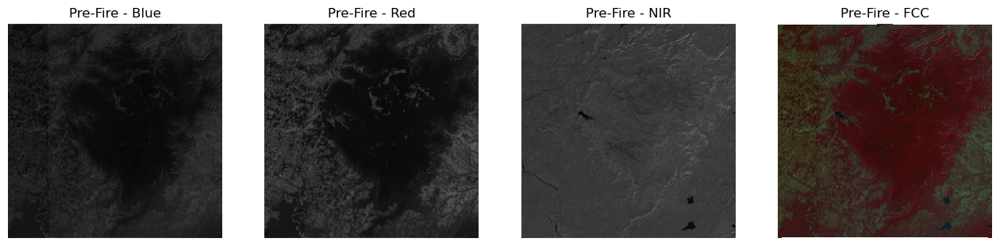

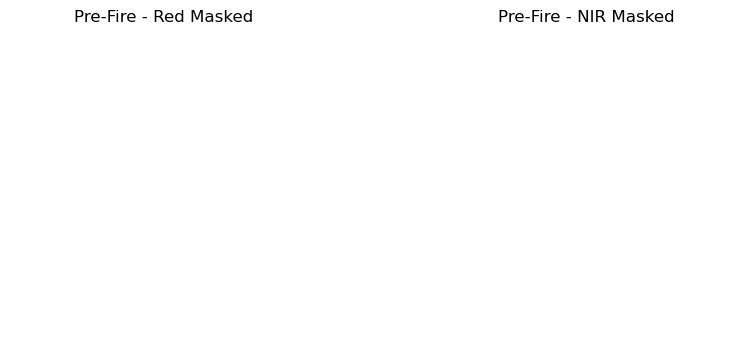

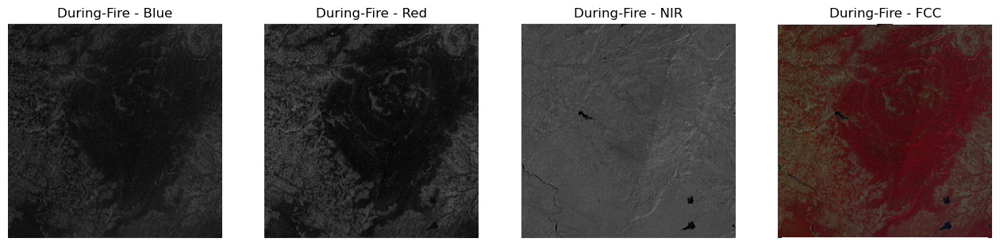

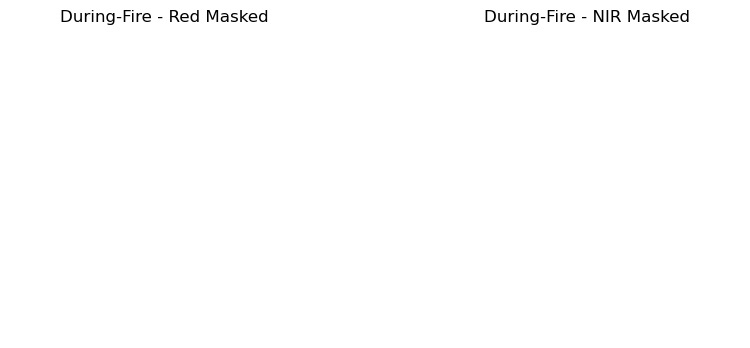

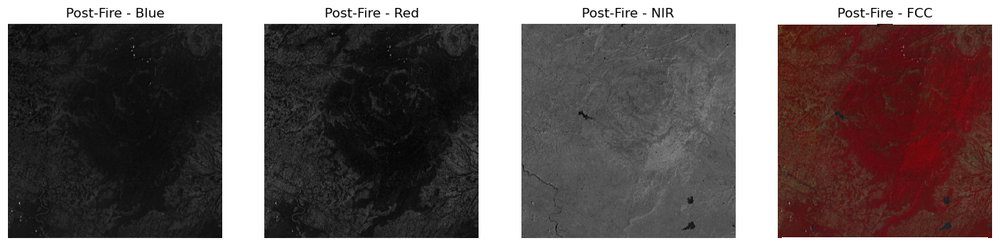

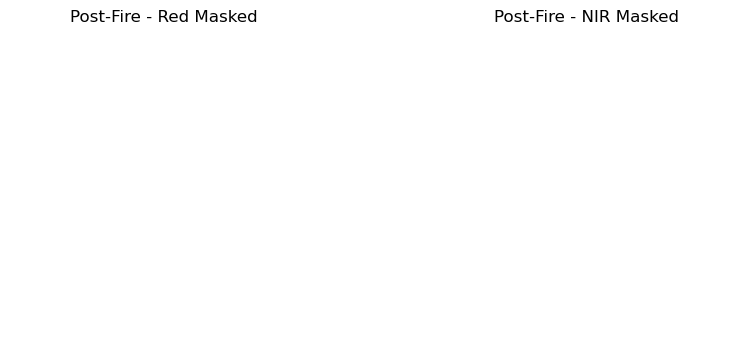

In [37]:
for phase, path in s2_images.items():
    display_s2_outputs(phase, path)


Pre- processing

2. ⁠Atmospheric Correction

In [ ]:
#DARK OBJECT SUBTRACTION (DOS)

In [38]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt

def dark_object_subtraction(band):
    """
    Simple DOS correction:
    subtract minimum reflectance (1st percentile)
    """
    dark_object = np.nanpercentile(band, 1)
    corrected = band - dark_object
    corrected[corrected < 0] = 0
    return corrected


In [39]:
def apply_dos_to_image(path, title):
    with rasterio.open(path) as src:
        blue = src.read(1).astype(float)
        red  = src.read(2).astype(float)
        nir  = src.read(3).astype(float)

    blue_dos = dark_object_subtraction(blue)
    red_dos  = dark_object_subtraction(red)
    nir_dos  = dark_object_subtraction(nir)

    # ---- DISPLAY BEFORE & AFTER ----
    plt.figure(figsize=(15,4))

    plt.subplot(1,3,1)
    plt.imshow(red, cmap='gray')
    plt.title(f"{title} Red (Before DOS)")
    plt.axis('off')

    plt.subplot(1,3,2)
    plt.imshow(red_dos, cmap='gray')
    plt.title(f"{title} Red (After DOS)")
    plt.axis('off')

    plt.subplot(1,3,3)
    plt.hist(red.flatten(), bins=100, alpha=0.5, label='Before')
    plt.hist(red_dos.flatten(), bins=100, alpha=0.5, label='After')
    plt.legend()
    plt.title("Histogram Comparison")

    plt.show()

    return blue_dos, red_dos, nir_dos


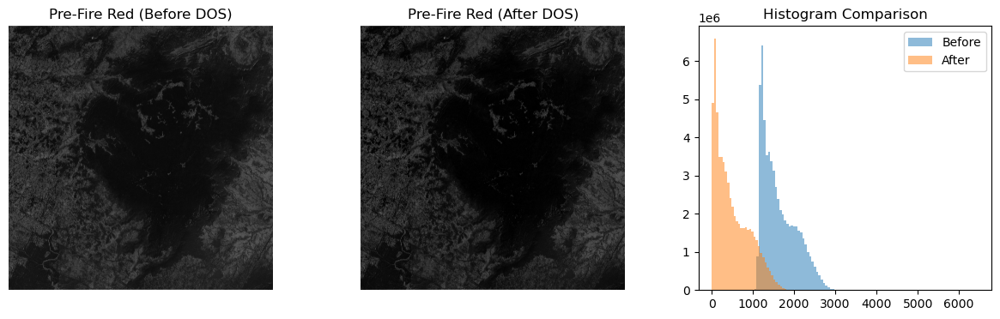

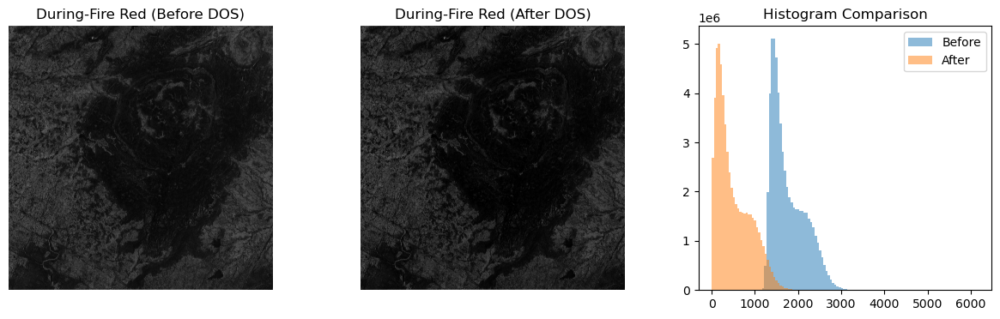

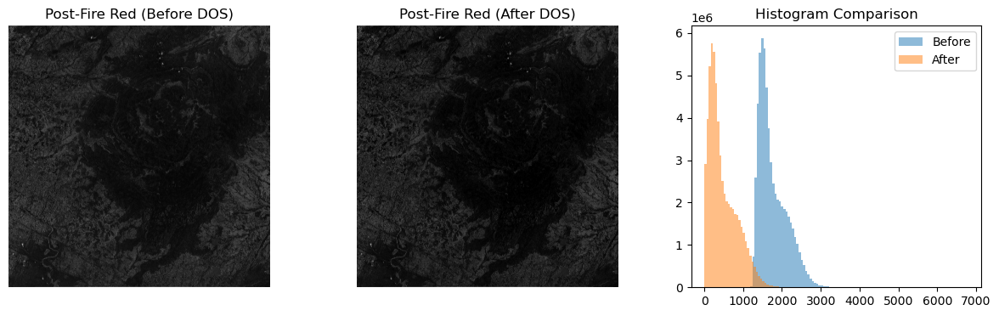

(array([[ nan,  nan,  nan, ...,  nan,  nan,  nan],
        [ nan,  nan,  nan, ...,  nan,  nan,  nan],
        [ nan,  nan,  nan, ...,  nan,  nan,  nan],
        ...,
        [293., 288., 288., ..., 211., 193., 209.],
        [358., 323., 323., ..., 221., 195., 176.],
        [335., 280., 280., ..., 187., 233., 197.]], shape=(7798, 7793)),
 array([[  nan,   nan,   nan, ...,   nan,   nan,   nan],
        [  nan,   nan,   nan, ...,   nan,   nan,   nan],
        [  nan,   nan,   nan, ...,   nan,   nan,   nan],
        ...,
        [443.5, 430. , 430. , ..., 271. , 275. , 273. ],
        [556. , 538. , 538. , ..., 263. , 273. , 287. ],
        [539. , 433. , 433. , ..., 243. , 286. , 287. ]],
       shape=(7798, 7793)),
 array([[   nan,    nan,    nan, ...,    nan,    nan,    nan],
        [   nan,    nan,    nan, ...,    nan,    nan,    nan],
        [   nan,    nan,    nan, ...,    nan,    nan,    nan],
        ...,
        [ 547. ,  376.5,  376.5, ..., 2283. , 2171. , 2319. ],
        [ 

In [40]:
apply_dos_to_image(
    "/Users/pragya/Documents/Similipal_Project/Fire_Project/S2_PreFire.tif",
    "Pre-Fire"
)

apply_dos_to_image(
    "/Users/pragya/Documents/Similipal_Project/Fire_Project/S2_DuringFire.tif",
    "During-Fire"
)

apply_dos_to_image(
    "/Users/pragya/Documents/Similipal_Project/Fire_Project/S2_PostFire.tif",
    "Post-Fire"
)


Pre- processing
3.⁠ ⁠Data Preparation
• Cloud-free pixel extraction

In [41]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt

def extract_cloud_free_pixels(path, title):
    with rasterio.open(path) as src:
        blue = src.read(1).astype(float)
        red  = src.read(2).astype(float)
        nir  = src.read(3).astype(float)
        swir = src.read(4).astype(float)

    # Temporary NDVI for cloud detection
    ndvi_temp = (nir - red) / (nir + red + 1e-6)

    # Spectral cloud mask
    cloud_mask = (blue < 0.3) & (ndvi_temp > 0.1)

    # Apply mask
    red_cf  = np.where(cloud_mask, red, np.nan)
    nir_cf  = np.where(cloud_mask, nir, np.nan)
    swir_cf = np.where(cloud_mask, swir, np.nan)

    # ---- OUTPUT DISPLAY ----
    plt.figure(figsize=(12,4))

    plt.subplot(1,3,1)
    plt.imshow(cloud_mask, cmap='gray')
    plt.title(f"{title} Cloud Mask\n(White = Clear)")
    plt.axis('off')

    plt.subplot(1,3,2)
    plt.imshow(red_cf, cmap='gray')
    plt.title(f"{title} Red (Cloud-Free)")
    plt.axis('off')

    plt.subplot(1,3,3)
    plt.imshow(nir_cf, cmap='gray')
    plt.title(f"{title} NIR (Cloud-Free)")
    plt.axis('off')

    plt.show()

    return red_cf, nir_cf, swir_cf


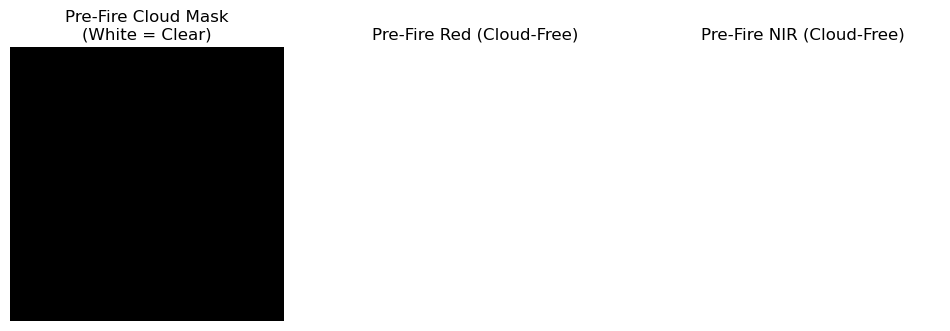

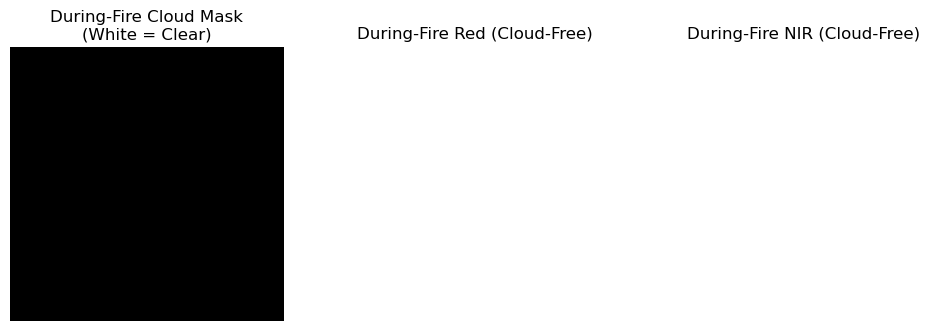

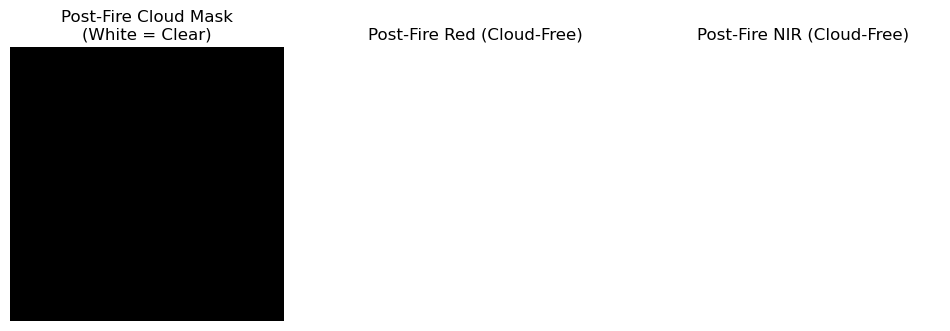

In [42]:
red_pre, nir_pre, swir_pre = extract_cloud_free_pixels(
    "/Users/pragya/Documents/Similipal_Project/Fire_Project/S2_PreFire.tif",
    "Pre-Fire"
)

red_dur, nir_dur, swir_dur = extract_cloud_free_pixels(
    "/Users/pragya/Documents/Similipal_Project/Fire_Project/S2_DuringFire.tif",
    "During-Fire"
)

red_post, nir_post, swir_post = extract_cloud_free_pixels(
    "/Users/pragya/Documents/Similipal_Project/Fire_Project/S2_PostFire.tif",
    "Post-Fire"
)


Spatial Subsetting to Study Area

In [2]:
import geopandas as gpd
from rasterio.mask import mask

def clip_to_study_area(raster_path, vector_path, title):
    with rasterio.open(raster_path) as src:
        study_area = gpd.read_file(vector_path)
        geoms = study_area.geometry.values

        clipped, transform = mask(src, geoms, crop=True)
        clipped = clipped[0]

    # ---- OUTPUT DISPLAY ----
    plt.figure(figsize=(5,5))
    plt.imshow(clipped, cmap='gray')
    plt.title(f"{title} Clipped to Study Area")
    plt.axis('off')
    plt.show()

    return clipped


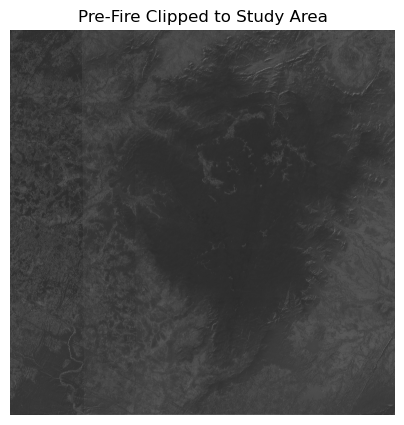

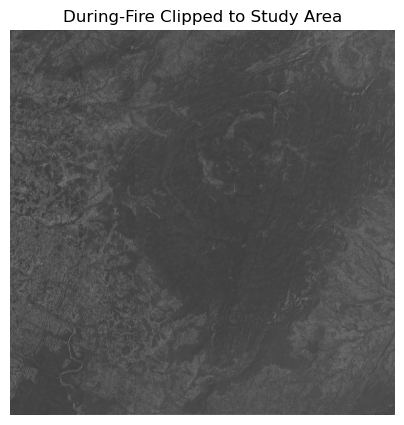

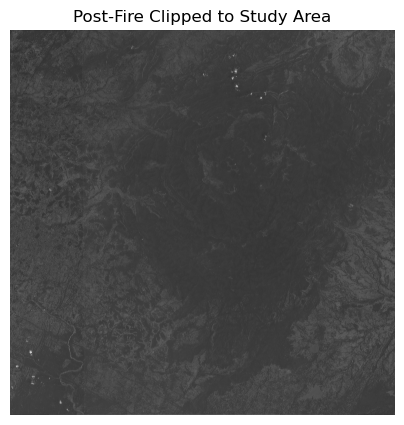

array([[   0. ,    0. ,    0. , ...,    0. ,    0. ,    0. ],
       [1188. , 1225.5, 1218. , ..., 1553. , 1553. , 1680.5],
       [1187.5, 1175.5, 1183. , ..., 1497. , 1578. , 1716.5],
       ...,
       [1518. , 1513. , 1513. , ..., 1436. , 1418. , 1434. ],
       [1583. , 1548. , 1548. , ..., 1446. , 1420. , 1401. ],
       [   0. ,    0. ,    0. , ...,    0. ,    0. ,    0. ]],
      shape=(7794, 7793))

In [5]:
boundary = "/Users/pragya/Documents/Similipal_Project/Fire_Project/similipal_boundary.geojson"

clip_to_study_area(
    "/Users/pragya/Documents/Similipal_Project/Fire_Project/S2_PreFire.tif",
    boundary,
    "Pre-Fire"
)

clip_to_study_area(
    "/Users/pragya/Documents/Similipal_Project/Fire_Project/S2_DuringFire.tif",
    boundary,
    "During-Fire"
)

clip_to_study_area(
    "/Users/pragya/Documents/Similipal_Project/Fire_Project/S2_PostFire.tif",
    boundary,
    "Post-Fire"
)


Algorithm for BRI

1. Input Data
• Use atmospherically corrected, cloud-masked GeoTIFF image (Sentinel-2 SR).
2. Band Selection
• Extracting NIR band
• Extracting SWIR band
3. Study Area Masking
• Only pixels within the study area were retained for further analysis.
4. Cloud-Free Pixel Assurance
• Ensuring pixels affected by clouds/shadows are excluded.
5. Index Computation
• Compute Burning Ratio Index using:
6. Pixel-wise Calculation
• Apply the equation to each pixel independently.
7. Output Generation
• Generating BRI raster image.
8. Post-Processing
• Mask invalid values (NoData / extreme values).
• Normalize or visualize BRI (if).
9. Feature Extraction (for Analysis)
• Extract mean / statistical BRI values for further comparison

In [6]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
from rasterio.mask import mask
import geopandas as gpd


In [7]:
#Band extraction

#Cloud-free pixel assurance

#Study area masking

def prepare_bri_inputs(s2_path, boundary_path):
    with rasterio.open(s2_path) as src:
        nir  = src.read(3).astype(float)   # B8
        swir = src.read(4).astype(float)   # B11
        meta = src.meta

    # ---- Spectral cloud masking ----
    # (reuse logic already accepted)
    red  = rasterio.open(s2_path).read(2).astype(float)
    blue = rasterio.open(s2_path).read(1).astype(float)

    ndvi_temp = (nir - red) / (nir + red + 1e-6)
    cloud_mask = (blue < 0.3) & (ndvi_temp > 0.1)

    nir  = np.where(cloud_mask, nir, np.nan)
    swir = np.where(cloud_mask, swir, np.nan)

    # ---- Study area clipping ----
    boundary = gpd.read_file(boundary_path)
    geoms = boundary.geometry.values

    with rasterio.open(s2_path) as src:
        nir_clip, _  = mask(src, geoms, crop=True, filled=True)
        swir_clip, _ = mask(src, geoms, crop=True, filled=True)

    nir_clip  = nir_clip[2].astype(float)
    swir_clip = swir_clip[3].astype(float)

    return nir_clip, swir_clip, meta


In [8]:
def compute_bri(nir, swir):
    bri = (nir - swir) / (nir + swir + 1e-6)
    return bri


In [9]:
def postprocess_bri(bri):
    bri[np.isinf(bri)] = np.nan
    bri[bri < -1] = np.nan
    bri[bri > 1]  = np.nan
    return bri


In [ ]:
#OUTPUT GENERATION
def save_bri(bri, meta, out_path):
    meta.update(dtype="float32", count=1)

    with rasterio.open(out_path, "w", **meta) as dst:
        dst.write(bri.astype("float32"), 1)


In [ ]:
#VISUALIZATION
def display_bri(bri, title):
    plt.figure(figsize=(6,6))
    plt.imshow(bri, cmap='hot')
    plt.colorbar(label="BRI")
    plt.title(title)
    plt.axis('off')
    plt.show()


In [ ]:
#FEATURE EXTRACTION
def bri_statistics(bri, label):
    print(f"{label} BRI Mean:", np.nanmean(bri))
    print(f"{label} BRI Std :", np.nanstd(bri))


In [13]:
boundary = "/Users/pragya/Documents/Similipal_Project/Fire_Project/similipal_boundary.geojson"

paths = {
    "Pre-Fire": "/Users/pragya/Documents/Similipal_Project/Fire_Project/S2_PreFire.tif",
    "During-Fire": "/Users/pragya/Documents/Similipal_Project/Fire_Project/S2_DuringFire.tif",
    "Post-Fire": "/Users/pragya/Documents/Similipal_Project/Fire_Project/S2_PostFire.tif"
}


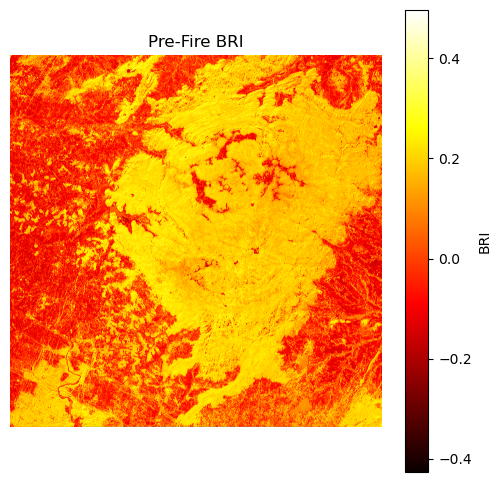

Pre-Fire BRI Mean: 0.08990707631773895
Pre-Fire BRI Std : 0.12293956331847171


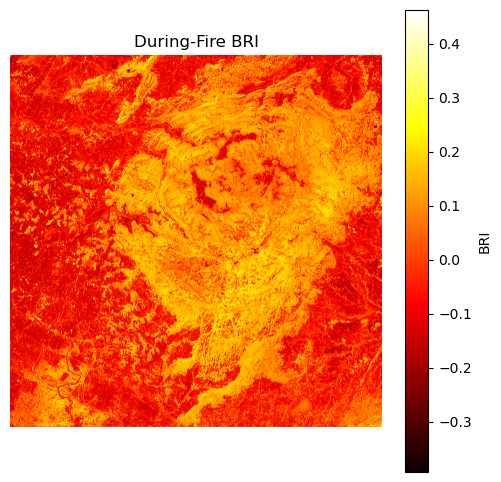

During-Fire BRI Mean: 0.01722132099387464
During-Fire BRI Std : 0.10867098015181247


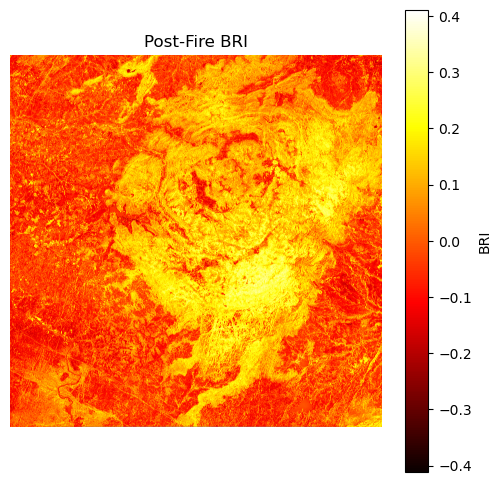

Post-Fire BRI Mean: 0.04088711865618063
Post-Fire BRI Std : 0.10590947352857681


In [14]:
for phase, path in paths.items():
    nir, swir, meta = prepare_bri_inputs(path, boundary)

    bri = compute_bri(nir, swir)
    bri = postprocess_bri(bri)

    display_bri(bri, f"{phase} BRI")
    bri_statistics(bri, phase)

    save_bri(
        bri,
        meta,
        f"/Users/pragya/Documents/Similipal_Project/Fire_Project/BRI_{phase}.tif"
    )


Algorithm for LST
1. Input Data
• Use preprocessed MODIS LST GeoTIFF (cloud-screened, atmospherically corrected).
2. Band Selection
• Extraction of LST Daytime band (thermal infrared band).
3. Study Area Masking
• Clip LST raster to the study area boundary.
4. Scale Factor Application
• Apply sensor-specific scale factor to convert digital values to temperature: Multiply pixel values by scale factor (0.02).
5. Unit Conversion
• Convert temperature from Kelvin to Celsius:
6. Cloud-Free Pixel Assurance
• Retain only valid, cloud-free pixels ensured by preprocessing.
7. Pixel-wise Temperature Estimation
• Compute LST for each pixel independently.
8. Output Generation
• Generate LST raster image in degrees Celsius.
9. Feature Extraction (for Analysis)
• Extract mean / statistical LST values for comparison and modeling.

In [35]:
def read_and_clip_lst(lst_path, boundary_path):
    with open(boundary_path) as f:
        shapes = [feature["geometry"] for feature in json.load(f)["features"]]

    with rasterio.open(lst_path) as src:
        lst_clip, transform = mask(src, shapes, crop=True)
        meta = src.meta.copy()

    lst_rel = lst_clip[0].astype(float)

    # Update metadata after clipping
    meta.update({
        "height": lst_rel.shape[0],
        "width": lst_rel.shape[1],
        "transform": transform,
        "count": 1,
        "dtype": "float32"
    })

    return lst_rel, meta


In [37]:
boundary_path = "/Users/pragya/Documents/Similipal_Project/Fire_Project/similipal_boundary.geojson"
LST_PATH = "/Users/pragya/Documents/Similipal_Project/Fire_Project/LST_PostFire_2025.tif"
OUTPUT_PATH = "/Users/pragya/Documents/Similipal_Project/Fire_Project/LST_PostFire_Relative.tif"
TITLE = "Post-Fire LST (Relative Units)"

lst_rel, meta = read_and_clip_lst(LST_PATH, boundary_path)


Mean Relative LST: 45078.4424330383
Std  Relative LST: 815.5436121137757


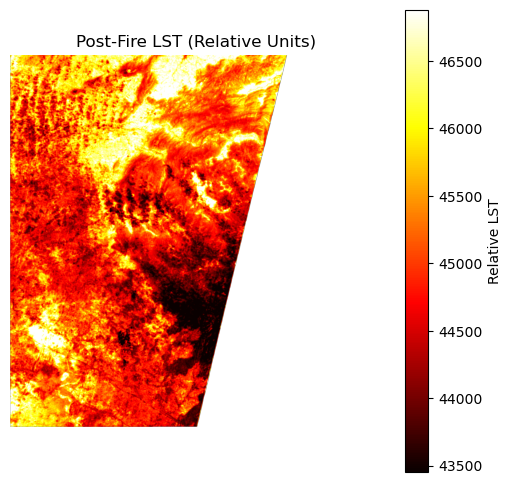

In [38]:
# --- MASK NODATA ONLY ---
lst_rel[lst_rel == 0] = np.nan

# --- FEATURE EXTRACTION ---
print("Mean Relative LST:", np.nanmean(lst_rel))
print("Std  Relative LST:", np.nanstd(lst_rel))

# --- VISUALIZATION ---
vmin, vmax = np.nanpercentile(lst_rel, (2, 98))

plt.figure(figsize=(6,6))
plt.imshow(lst_rel, cmap="hot", vmin=vmin, vmax=vmax)
plt.colorbar(label="Relative LST")
plt.title(TITLE)
plt.axis("off")
plt.show()

# --- OUTPUT GENERATION ---
meta.update(
    dtype="float32",
    count=1,
    height=lst_rel.shape[0],
    width=lst_rel.shape[1]
)

with rasterio.open(OUTPUT_PATH, "w", **meta) as dst:
    dst.write(lst_rel.astype("float32"), 1)


In [40]:
def read_and_clip_lst(lst_path, boundary_path):
    with open(boundary_path) as f:
        shapes = [feature["geometry"] for feature in json.load(f)["features"]]

    with rasterio.open(lst_path) as src:
        lst_clip, transform = mask(src, shapes, crop=True)
        meta = src.meta.copy()

    lst_rel = lst_clip[0].astype(float)

    meta.update({
        "height": lst_rel.shape[0],
        "width": lst_rel.shape[1],
        "transform": transform,
        "count": 1,
        "dtype": "float32"
    })

    return lst_rel, meta


In [41]:
boundary_path = "/Users/pragya/Documents/Similipal_Project/Fire_Project/similipal_boundary.geojson"

lst_files = {
    "Pre-Fire": {
        "input": "/Users/pragya/Documents/Similipal_Project/Fire_Project/LST_PreFire_2025.tif",
        "output": "/Users/pragya/Documents/Similipal_Project/Fire_Project/LST_PreFire_Relative.tif"
    },
    "During-Fire": {
        "input": "/Users/pragya/Documents/Similipal_Project/Fire_Project/LST_DuringFire_2025.tif",
        "output": "/Users/pragya/Documents/Similipal_Project/Fire_Project/LST_DuringFire_Relative.tif"
    },
    "Post-Fire": {
        "input": "/Users/pragya/Documents/Similipal_Project/Fire_Project/LST_PostFire_2025.tif",
        "output": "/Users/pragya/Documents/Similipal_Project/Fire_Project/LST_PostFire_Relative.tif"
    }
}



Processing Pre-Fire LST...
Mean Relative LST: 43355.72738495147
Std  Relative LST: 841.5843313254089


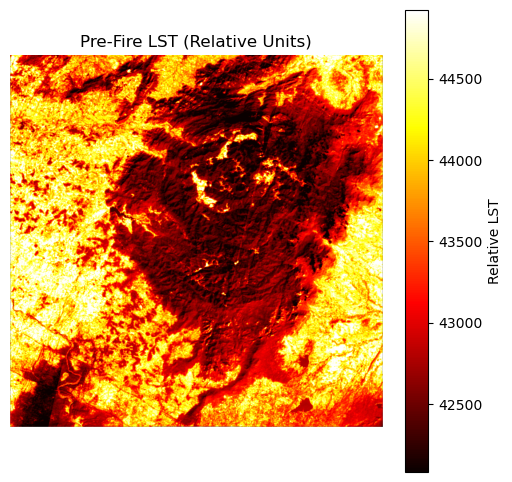


Processing During-Fire LST...
Mean Relative LST: 45776.32000045672
Std  Relative LST: 1039.8697720875416


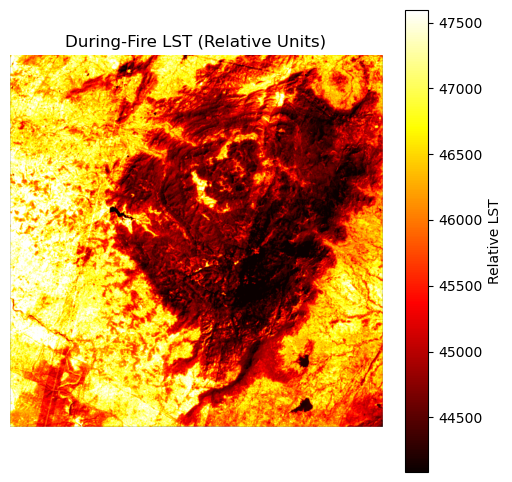


Processing Post-Fire LST...
Mean Relative LST: 45078.4424330383
Std  Relative LST: 815.5436121137757


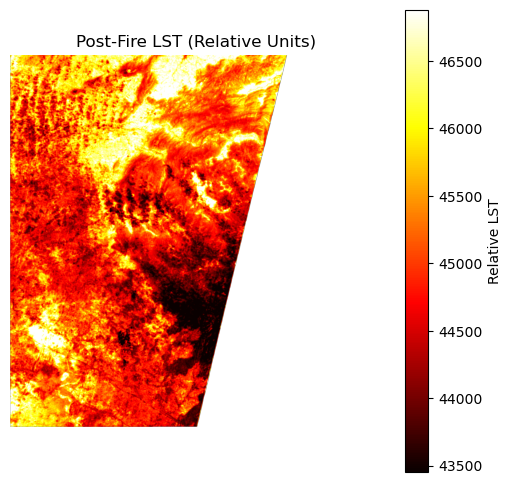

In [42]:
for phase, paths in lst_files.items():

    print(f"\nProcessing {phase} LST...")

    # Read + clip
    lst_rel, meta = read_and_clip_lst(paths["input"], boundary_path)

    # Mask NoData only
    lst_rel[lst_rel == 0] = np.nan

    # Feature extraction
    print("Mean Relative LST:", np.nanmean(lst_rel))
    print("Std  Relative LST:", np.nanstd(lst_rel))

    # Visualization
    vmin, vmax = np.nanpercentile(lst_rel, (2, 98))

    plt.figure(figsize=(6,6))
    plt.imshow(lst_rel, cmap="hot", vmin=vmin, vmax=vmax)
    plt.colorbar(label="Relative LST")
    plt.title(f"{phase} LST (Relative Units)")
    plt.axis("off")
    plt.show()

    # Save output
    with rasterio.open(paths["output"], "w", **meta) as dst:
        dst.write(lst_rel.astype("float32"), 1)


Algorithm For NDVI
1. Input Data
• Use atmospherically corrected, cloud-masked GeoTIFF image (Sentinel-2 surface reflectance).
2. Band Selection
• Extract Red band
• Extract Near-Infrared (NIR) band
3. Study Area Masking
• Clip both bands to the study area boundary.
4. Cloud-Free Pixel Assurance
• Ensure removal of cloud-affected and shadow pixels from preprocessing.
5. Index Computation
• Compute NDVI using:
6. Pixel-wise Calculation
• Apply the NDVI formula independently to each pixel.
7. Output Generation
• Generate NDVI raster image.
8. Value Range Validation
• Validate NDVI values within the range –1 to +1.
9. Feature Extraction (for Analysis)
• Extract mean / statistical NDVI values for temporal comparison and modeling.


In [43]:
#STUDY AREA MASKING + BAND EXTRACTION

In [52]:
def read_clip_s2_bands(s2_path, boundary_path):
    with open(boundary_path) as f:
        shapes = [feature["geometry"] for feature in json.load(f)["features"]]

    with rasterio.open(s2_path) as src:
        # Clip Red band (B4)
        red_clip, transform = mask(src, shapes, crop=True, indexes=2)
        red_clip = red_clip.astype(float)

        # Clip NIR band (B8)
        nir_clip, _ = mask(src, shapes, crop=True, indexes=3)
        nir_clip = nir_clip.astype(float)

        meta = src.meta.copy()

    # Update metadata correctly
    meta.update({
        "height": red_clip.shape[0],
        "width": red_clip.shape[1],
        "transform": transform,
        "count": 1,
        "dtype": "float32"
    })

    return red_clip, nir_clip, meta


In [45]:
def mask_invalid_pixels(red, nir):
    mask_valid = (red > 0) & (nir > 0)
    red = np.where(mask_valid, red, np.nan)
    nir = np.where(mask_valid, nir, np.nan)
    return red, nir


In [46]:
#NDVI FORMULA
def compute_ndvi(red, nir):
    ndvi = (nir - red) / (nir + red + 1e-6)
    return ndvi


In [48]:
#VALUE RANGE VALIDATION
def validate_ndvi(ndvi):
    ndvi[ndvi < -1] = np.nan
    ndvi[ndvi >  1] = np.nan
    return ndvi
#FEATURE EXTRACTION
def ndvi_statistics(ndvi, label):
    print(f"{label} NDVI Mean:", np.nanmean(ndvi))
    print(f"{label} NDVI Std :", np.nanstd(ndvi))
#VISUALIZATION FUNCTION
def display_ndvi(ndvi, title):
    plt.figure(figsize=(6,6))
    plt.imshow(ndvi, cmap="RdYlGn", vmin=-1, vmax=1)
    plt.colorbar(label="NDVI")
    plt.title(title)
    plt.axis("off")
    plt.show()

def save_ndvi(ndvi, meta, out_path):
    with rasterio.open(out_path, "w", **meta) as dst:
        dst.write(ndvi.astype("float32"), 1)



In [49]:
boundary_path = "/Users/pragya/Documents/Similipal_Project/Fire_Project/similipal_boundary.geojson"

s2_files = {
    "Pre-Fire": {
        "input": "/Users/pragya/Documents/Similipal_Project/Fire_Project/S2_PreFire.tif",
        "output": "/Users/pragya/Documents/Similipal_Project/Fire_Project/NDVI_PreFire.tif"
    },
    "During-Fire": {
        "input": "/Users/pragya/Documents/Similipal_Project/Fire_Project/S2_DuringFire.tif",
        "output": "/Users/pragya/Documents/Similipal_Project/Fire_Project/NDVI_DuringFire.tif"
    },
    "Post-Fire": {
        "input": "/Users/pragya/Documents/Similipal_Project/Fire_Project/S2_PostFire.tif",
        "output": "/Users/pragya/Documents/Similipal_Project/Fire_Project/NDVI_PostFire.tif"
    }
}



Processing Pre-Fire NDVI...
Pre-Fire NDVI Mean: 0.3514813170924923
Pre-Fire NDVI Std : 0.11606386270568884


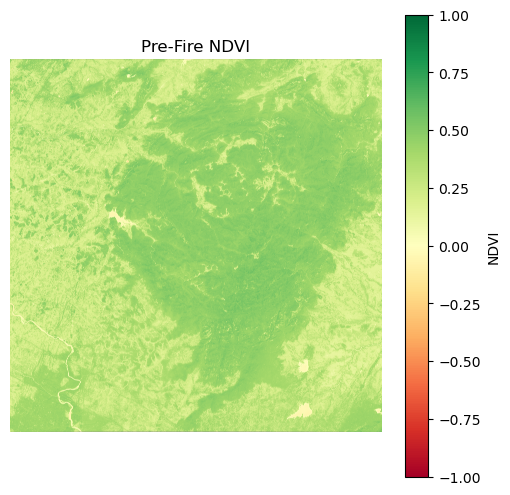


Processing During-Fire NDVI...
During-Fire NDVI Mean: 0.3230356315661035
During-Fire NDVI Std : 0.10117060950377402


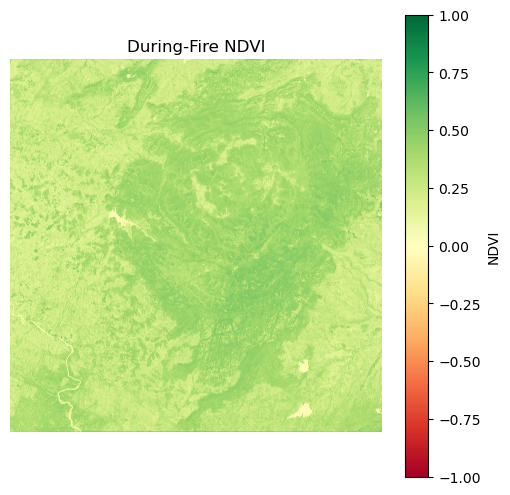


Processing Post-Fire NDVI...
Post-Fire NDVI Mean: 0.3681742127309858
Post-Fire NDVI Std : 0.10449355619061476


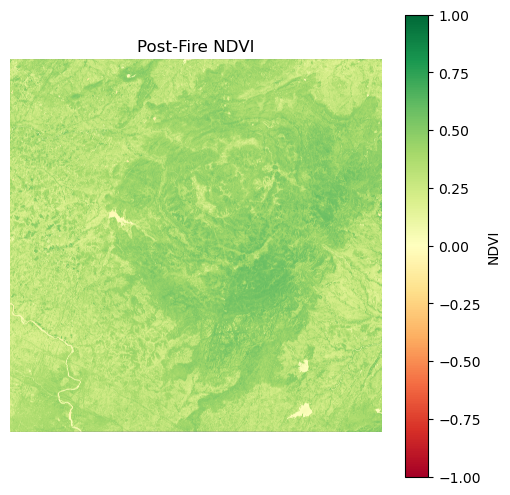

In [53]:
for phase, paths in s2_files.items():

    print(f"\nProcessing {phase} NDVI...")

    # Band extraction + clipping
    red, nir, meta = read_clip_s2_bands(paths["input"], boundary_path)

    # Cloud-free assurance
    red, nir = mask_invalid_pixels(red, nir)

    # NDVI computation
    ndvi = compute_ndvi(red, nir)

    # Range validation
    ndvi = validate_ndvi(ndvi)

    # Statistics
    ndvi_statistics(ndvi, phase)

    # Visualization
    display_ndvi(ndvi, f"{phase} NDVI")

    # Save output
    save_ndvi(ndvi, meta, paths["output"])


MULTI-TEMPORAL CHANGE ANALYSIS

In [1]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt


In [2]:
#Read raster and mask NoData
def read_raster(path):
    with rasterio.open(path) as src:
        data = src.read(1).astype(float)
        meta = src.meta
    data[data == 0] = np.nan
    return data, meta


In [5]:
import os

BASE_DIR = "/Users/pragya/Documents/Similipal_Project/Fire_Project"


In [7]:
#load all index images
#NDVI
ndvi_pre, _ = read_raster(os.path.join(BASE_DIR, "NDVI_PreFire.tif"))
ndvi_dur, _ = read_raster(os.path.join(BASE_DIR, "NDVI_DuringFire.tif"))
ndvi_post, _ = read_raster(os.path.join(BASE_DIR, "NDVI_PostFire.tif"))

#LST
lst_pre, _ = read_raster(os.path.join(BASE_DIR, "LST_PreFire_Relative.tif"))
lst_dur, _ = read_raster(os.path.join(BASE_DIR, "LST_DuringFire_Relative.tif"))
lst_post, _ = read_raster(os.path.join(BASE_DIR, "LST_PostFire_Relative.tif"))

# BRI
bri_pre, bri_meta = read_raster(os.path.join(BASE_DIR, "BRI_Pre-Fire.tif"))
bri_dur, _ = read_raster(os.path.join(BASE_DIR, "BRI_During-Fire.tif"))
bri_post, _ = read_raster(os.path.join(BASE_DIR, "BRI_Post-Fire.tif"))

print("NDVI shapes:", ndvi_pre.shape, ndvi_dur.shape, ndvi_post.shape)
print("LST shapes :", lst_pre.shape, lst_dur.shape, lst_post.shape)
print("BRI shapes :", bri_pre.shape, bri_dur.shape, bri_post.shape)




NDVI shapes: (7794, 7793) (7794, 7793) (7794, 7793)
LST shapes : (2599, 2599) (2599, 2599) (2599, 2599)
BRI shapes : (7798, 7793) (7798, 7793) (7798, 7793)


In [8]:
#VISUALIZATION FUNCTION
import matplotlib.pyplot as plt
import numpy as np

def show_change_map(data, title, cmap):
    vmin, vmax = np.nanpercentile(data, (2, 98))
    plt.figure(figsize=(6,6))
    plt.imshow(data, cmap=cmap, vmin=vmin, vmax=vmax)
    plt.colorbar(label=title)
    plt.title(title)
    plt.axis("off")
    plt.show()


In [10]:
dNDVI_during = ndvi_dur - ndvi_pre
dNDVI_post   = ndvi_post - ndvi_pre

dLST_during = lst_dur - lst_pre
dLST_post   = lst_post - lst_pre

dBRI_during = bri_dur - bri_pre
dBRI_post   = bri_post - bri_pre



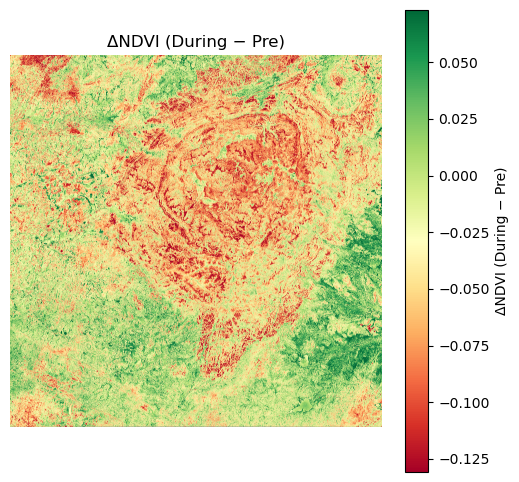

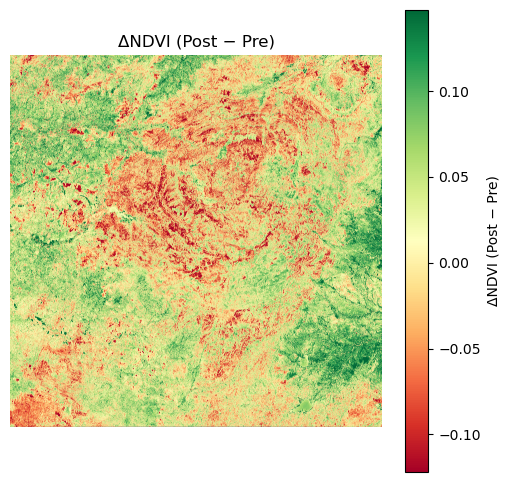

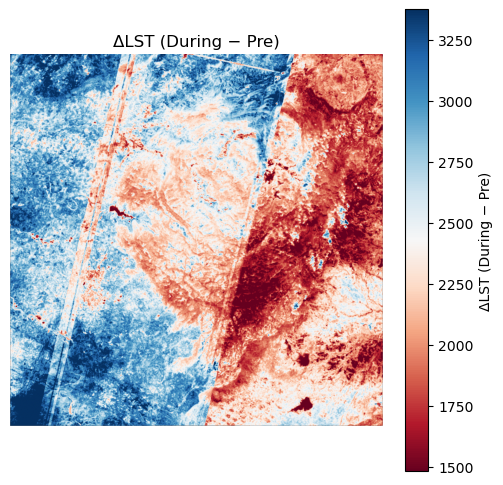

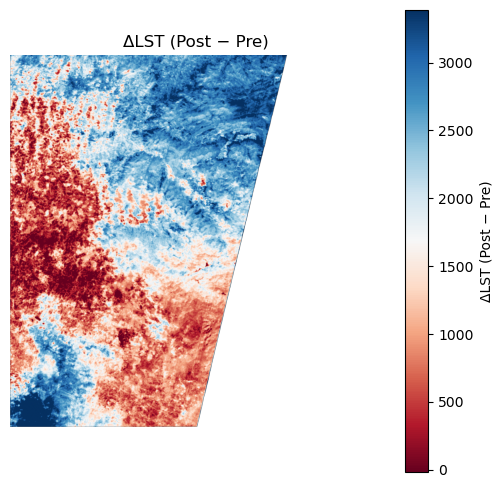

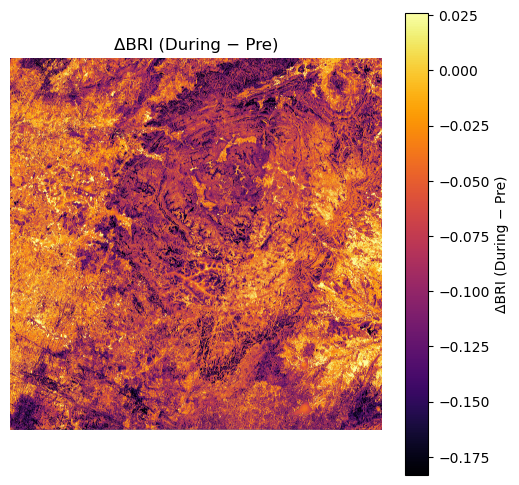

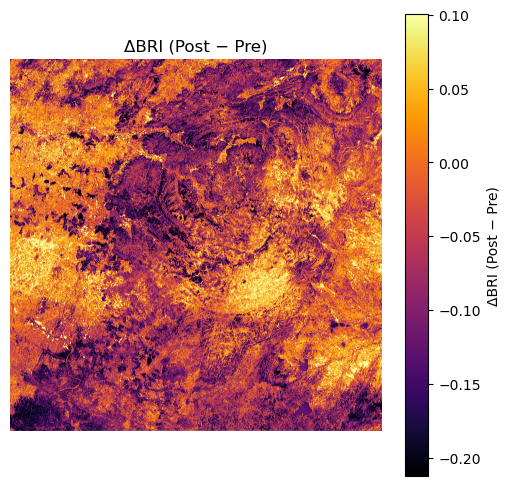

In [11]:
show_change_map(dNDVI_during, "ΔNDVI (During − Pre)", cmap="RdYlGn")
show_change_map(dNDVI_post,   "ΔNDVI (Post − Pre)", cmap="RdYlGn")

show_change_map(dLST_during, "ΔLST (During − Pre)", cmap="RdBu")
show_change_map(dLST_post,   "ΔLST (Post − Pre)", cmap="RdBu")

show_change_map(dBRI_during, "ΔBRI (During − Pre)", cmap="inferno")
show_change_map(dBRI_post,   "ΔBRI (Post − Pre)", cmap="inferno")



Multi-temporal Change Analysis

In [12]:
def temporal_stats(data, name):
    print(f"\n{name}")
    print("Mean:", np.nanmean(data))
    print("Std :", np.nanstd(data))
    print("Min :", np.nanmin(data))
    print("Max :", np.nanmax(data))

temporal_stats(dNDVI_during, "ΔNDVI During")
temporal_stats(dNDVI_post,   "ΔNDVI Post")

temporal_stats(dLST_during, "ΔLST During")
temporal_stats(dLST_post,   "ΔLST Post")

temporal_stats(dBRI_during, "ΔBRI During")
temporal_stats(dBRI_post,   "ΔBRI Post")



ΔNDVI During
Mean: -0.02844610066683853
Std : 0.048602886348878487
Min : -0.5159834921360016
Max : 0.5143317952752113

ΔNDVI Post
Mean: 0.016692636031817202
Std : 0.06529796765040542
Min : -0.5619782656431198
Max : 0.6328308396041393

ΔLST During
Mean: 2420.5926155052503
Std : 500.4176046510988
Min : 91.5
Max : 4880.0

ΔLST Post
Mean: 1699.4690114447217
Std : 965.9184630096947
Min : -1766.5
Max : 4617.5

ΔBRI During
Mean: -0.07269571432337495
Std : 0.05162571356252
Min : -0.4838695675134659
Max : 0.5136120319366455

ΔBRI Post
Mean: -0.0490233879826713
Std : 0.07867906282235868
Min : -0.5532707720994949
Max : 0.6913648843765259


In [13]:
import rasterio

def save_change_map(data, meta, out_path):
    meta.update(dtype="float32", count=1)
    with rasterio.open(out_path, "w", **meta) as dst:
        dst.write(data.astype("float32"), 1)
save_change_map(dNDVI_during, bri_meta, "dNDVI_During.tif")
save_change_map(dNDVI_post,   bri_meta, "dNDVI_Post.tif")

save_change_map(dLST_during, bri_meta, "dLST_During.tif")
save_change_map(dLST_post,   bri_meta, "dLST_Post.tif")

save_change_map(dBRI_during, bri_meta, "dBRI_During.tif")
save_change_map(dBRI_post,   bri_meta, "dBRI_Post.tif")


Cross-Satellite Consistency Analysis


Pre-Fire NDVI vs LST
Correlation (r): -0.828
P-value: 0.0000e+00


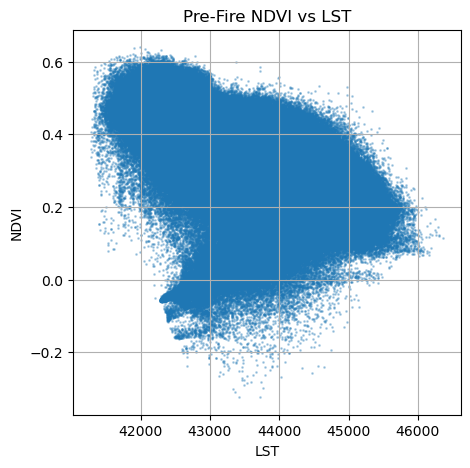


During-Fire NDVI vs LST
Correlation (r): -0.761
P-value: 0.0000e+00


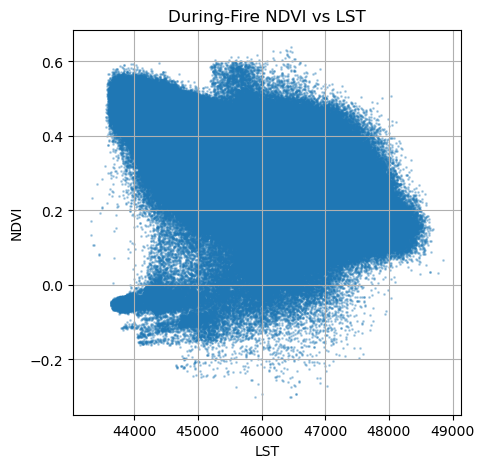


Post-Fire NDVI vs LST
Correlation (r): -0.412
P-value: 0.0000e+00


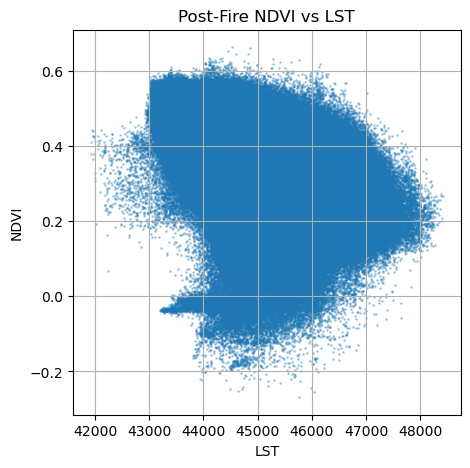

In [16]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import pearsonr
from rasterio.enums import Resampling
from rasterio.warp import reproject

def read_raster_with_meta(path):
    with rasterio.open(path) as src:
        data = src.read(1).astype(float)
        meta = src.meta
    return data, meta
def resample_to_match(src_data, src_meta, tgt_meta):
    dst = np.empty(
        (tgt_meta["height"], tgt_meta["width"]),
        dtype=np.float32
    )

    reproject(
        source=src_data,
        destination=dst,
        src_transform=src_meta["transform"],
        src_crs=src_meta["crs"],
        dst_transform=tgt_meta["transform"],
        dst_crs=tgt_meta["crs"],
        resampling=Resampling.average
    )
    return dst
# NDVI
ndvi_pre,  ndvi_meta  = read_raster_with_meta("Fire_Project/NDVI_PreFire.tif")
ndvi_dur,  _          = read_raster_with_meta("Fire_Project/NDVI_DuringFire.tif")
ndvi_post, _          = read_raster_with_meta("Fire_Project/NDVI_PostFire.tif")

# LST
lst_pre,  lst_meta = read_raster_with_meta("Fire_Project/LST_PreFire_Relative.tif")
lst_dur,  _        = read_raster_with_meta("Fire_Project/LST_DuringFire_Relative.tif")
lst_post, _        = read_raster_with_meta("Fire_Project/LST_PostFire_Relative.tif")

ndvi_pre_r  = resample_to_match(ndvi_pre,  ndvi_meta, lst_meta)
ndvi_dur_r  = resample_to_match(ndvi_dur,  ndvi_meta, lst_meta)
ndvi_post_r = resample_to_match(ndvi_post, ndvi_meta, lst_meta)

#invalid pixels
def prepare_pairs(ndvi, lst):
    mask = (
        np.isfinite(ndvi) &
        np.isfinite(lst) &
        (ndvi >= -1) & (ndvi <= 1)
    )
    return ndvi[mask], lst[mask]

#Correlation + Scatter Plot Function
def analyze_phase(ndvi, lst, title):
    ndvi_v, lst_v = prepare_pairs(ndvi, lst)

    r, p = pearsonr(ndvi_v, lst_v)

    print(f"\n{title}")
    print(f"Correlation (r): {r:.3f}")
    print(f"P-value: {p:.4e}")

    plt.figure(figsize=(5,5))
    plt.scatter(lst_v, ndvi_v, s=1, alpha=0.3)
    plt.xlabel("LST")
    plt.ylabel("NDVI")
    plt.title(title)
    plt.grid(True)
    plt.show()

#analyze each phase
analyze_phase(ndvi_pre_r,  lst_pre,  "Pre-Fire NDVI vs LST")
analyze_phase(ndvi_dur_r,  lst_dur,  "During-Fire NDVI vs LST")
analyze_phase(ndvi_post_r, lst_post, "Post-Fire NDVI vs LST")


NDVI-up & LST down----> healthy

Coupled Fire Impact Modeling
Step 1: Input Data
Step 2: Pixel-wise NDVI Change Analysis (Way 1 – Effect Based)
    Compute vegetation change using NDVI difference
    Compute percentage vegetation change
Step 3: Coupled Fire Impact Modeling (Way 2 – Cause Based)
    NDVI change
    BRI change
    LST change
    Establish a coupled relationship
    Analyze how fire severity and temperature together explain vegetation degradation
Step 4: Comparison of Both Approaches
    Compare spatial patterns
    Validate whether areas with high NDVI loss correspond to high fire severity and high surface temperature.
Step 5: Post-Fire Recovery Rate Analysis
    Compute vegetation recovery index
    Recovery Index=NDVI(post) ​− NDVI(during​)
Step 6: Threshold-Based Damage Mapping
| Damage Class    | NDVI Change      |
| --------------- | ---------------- |
| Low Damage      | NDVI loss < 10%  |
| Moderate Damage | NDVI loss 10–20% |
| High Damage     | NDVI loss > 20%  |

Step 7: Cross-Analysis of Damage and Recovery
Step 8: Output Generation, Interpretation and Reporting

In [6]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
from rasterio.warp import reproject
from rasterio.enums import Resampling
from sklearn.linear_model import LinearRegression
# STEP 1
def read_raster_with_meta(path):
    with rasterio.open(path) as src:
        data = src.read(1).astype(float)
        meta = src.meta
    data[data == 0] = np.nan
    return data, meta

# NDVI (REFERENCE GRID)
ndvi_pre, ndvi_meta = read_raster_with_meta("Fire_Project/NDVI_PreFire.tif")
ndvi_dur, _         = read_raster_with_meta("Fire_Project/NDVI_DuringFire.tif")

# BRI
bri_pre, bri_meta = read_raster_with_meta("Fire_Project/BRI_Pre-Fire.tif")
bri_dur, _        = read_raster_with_meta("Fire_Project/BRI_During-Fire.tif")

# LST
lst_pre, lst_meta = read_raster_with_meta("Fire_Project/LST_PreFire_Relative.tif")
lst_dur, _        = read_raster_with_meta("Fire_Project/LST_DuringFire_Relative.tif")



In [12]:
#STEP 2
# NDVI change
dNDVI = ndvi_dur - ndvi_pre

# Percentage NDVI change
percent_dNDVI = (dNDVI / np.abs(ndvi_pre)) * 100
percent_dNDVI[np.abs(ndvi_pre) < 0.05] = np.nan


===== STEP 2: NDVI-ONLY CHANGE ANALYSIS (WAY-1) =====

ΔNDVI During Fire
Mean: -0.02844610066683853
Std : 0.048602886348878487
Min : -0.5159834921360016
Max : 0.5143317952752113

% NDVI Change During Fire
Mean: -6.066231752151334
Std : 16.559602035702703
Min : -365.69253353211695
Max : 955.0399151874091


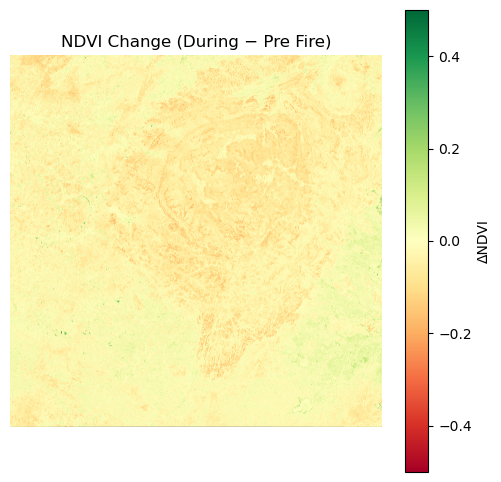

In [15]:
print("===== STEP 2: NDVI-ONLY CHANGE ANALYSIS (WAY-1) =====")

print("\nΔNDVI During Fire")
print("Mean:", np.nanmean(dNDVI))
print("Std :", np.nanstd(dNDVI))
print("Min :", np.nanmin(dNDVI))
print("Max :", np.nanmax(dNDVI))

print("\n% NDVI Change During Fire")
print("Mean:", np.nanmean(percent_dNDVI))
print("Std :", np.nanstd(percent_dNDVI))
print("Min :", np.nanmin(percent_dNDVI))
print("Max :", np.nanmax(percent_dNDVI))

plt.figure(figsize=(6,6))
plt.imshow(dNDVI, cmap="RdYlGn", vmin=-0.5, vmax=0.5)
plt.colorbar(label="ΔNDVI")
plt.title("NDVI Change (During − Pre Fire)")
plt.axis("off")
plt.show()

#Red = vegetation loss
#Green = vegetation gain
#Yellow = little/no change


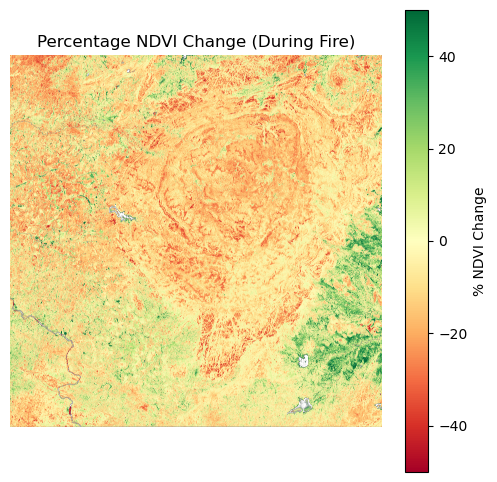

In [16]:
#VISUALIZE % NDVI CHANGE
plt.figure(figsize=(6,6))
plt.imshow(percent_dNDVI, cmap="RdYlGn", vmin=-50, vmax=50)
plt.colorbar(label="% NDVI Change")
plt.title("Percentage NDVI Change (During Fire)")
plt.axis("off")
plt.show()
def save_raster(data, meta, out_path):
    meta.update(dtype="float32", count=1)
    with rasterio.open(out_path, "w", **meta) as dst:
        dst.write(data.astype("float32"), 1)

save_raster(dNDVI, meta, "Fire_Project/dNDVI_During.tif")
save_raster(percent_dNDVI, meta, "Fire_Project/Percent_dNDVI_During.tif")



In [17]:
#Step 3
# NDVI change (already computed in Step-2)
# dNDVI = ndvi_dur - ndvi_pre

# Fire severity change
dBRI = bri_dur_r - bri_pre_r

# Temperature change
dLST = lst_dur_r - lst_pre_r


In [19]:
mask = (
    np.isfinite(dNDVI) &
    np.isfinite(dBRI) &
    np.isfinite(dLST)
)

print("Total valid pixels used for modeling:", np.sum(mask))

#regression dataset
X = np.column_stack((dBRI[mask], dLST[mask]))
y = dNDVI[mask]
from sklearn.linear_model import LinearRegression
model = LinearRegression()
model.fit(X, y)

print("\n===== STEP 3: COUPLED FIRE IMPACT MODEL (WAY-2) =====")

print("\nRegression Equation:")
print(f"ΔNDVI = {model.intercept_:.4f} "
      f"+ ({model.coef_[0]:.4f}) × ΔBRI "
      f"+ ({model.coef_[1]:.4f}) × ΔLST")

print("\nModel Performance:")
print("R² Score:", model.score(X, y))

print("\nDriver Importance:")
if abs(model.coef_[0]) > abs(model.coef_[1]):
    print("→ Fire severity (BRI) is the dominant driver")
else:
    print("→ Thermal stress (LST) is the dominant driver")



Total valid pixels used for modeling: 60517336

===== STEP 3: COUPLED FIRE IMPACT MODEL (WAY-2) =====

Regression Equation:
ΔNDVI = -0.0032 + (0.6898) × ΔBRI + (0.0000) × ΔLST

Model Performance:
R² Score: 0.32063487818491065

Driver Importance:
→ Fire severity (BRI) is the dominant driver


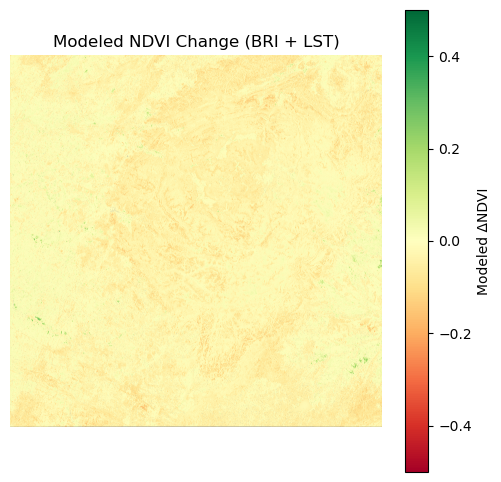

In [20]:
modeled_dNDVI = np.full(dNDVI.shape, np.nan)
modeled_dNDVI[mask] = model.predict(X)
plt.figure(figsize=(6,6))
plt.imshow(modeled_dNDVI, cmap="RdYlGn", vmin=-0.5, vmax=0.5)
plt.colorbar(label="Modeled ΔNDVI")
plt.title("Modeled NDVI Change (BRI + LST)")
plt.axis("off")
plt.show()


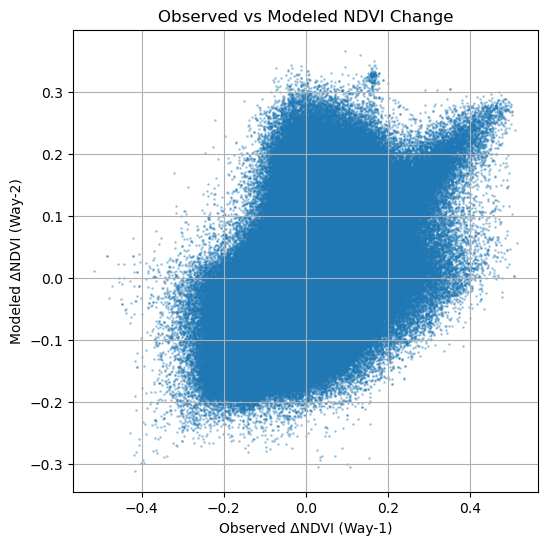

In [22]:
plt.figure(figsize=(6,6))
plt.scatter(dNDVI[mask], modeled_dNDVI[mask], s=1, alpha=0.3)
plt.xlabel("Observed ΔNDVI (Way-1)")
plt.ylabel("Modeled ΔNDVI (Way-2)")
plt.title("Observed vs Modeled NDVI Change")
plt.grid(True)
plt.show()
save_raster(modeled_dNDVI, meta, "Fire_Project/Modeled_dNDVI.tif")



===== STEP 4: COMPARISON OF WAY-1 vs WAY-2 =====
Correlation between observed and modeled ΔNDVI: 0.5817759295705255


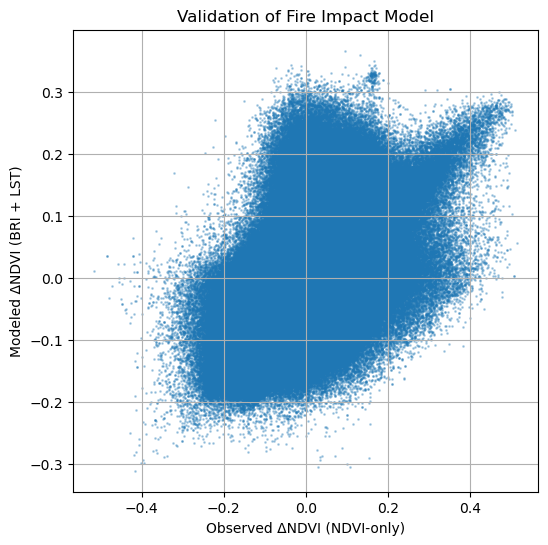

In [23]:
print("===== STEP 4: COMPARISON OF WAY-1 vs WAY-2 =====")

# Correlation
corr = np.corrcoef(dNDVI[mask], modeled_dNDVI[mask])[0,1]

print("Correlation between observed and modeled ΔNDVI:", corr)

#Correlation close to 1 → very good match
#Correlation > 0.5 → acceptable & meaningful

plt.figure(figsize=(6,6))
plt.scatter(dNDVI[mask], modeled_dNDVI[mask], s=1, alpha=0.3)
plt.xlabel("Observed ΔNDVI (NDVI-only)")
plt.ylabel("Modeled ΔNDVI (BRI + LST)")
plt.title("Validation of Fire Impact Model")
plt.grid(True)
plt.show()


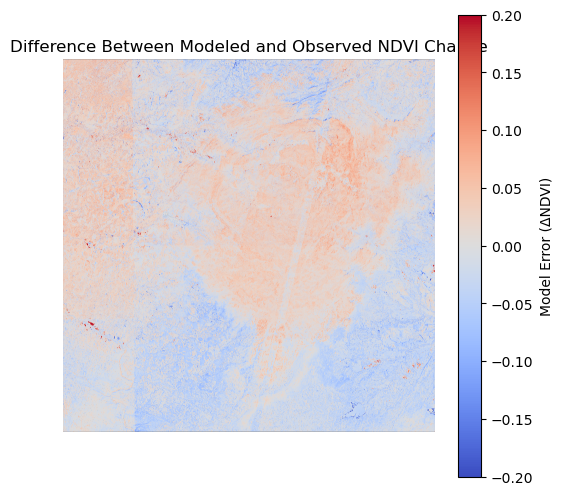

In [27]:
error_map = modeled_dNDVI - dNDVI

plt.figure(figsize=(6,6))
plt.imshow(error_map, cmap="coolwarm", vmin=-0.2, vmax=0.2)
plt.colorbar(label="Model Error (ΔNDVI)")
plt.title("Difference Between Modeled and Observed NDVI Change")
plt.axis("off")
plt.show()

error_map = modeled_dNDVI - dNDVI



#Small error → good prediction
#Large error → local complexity (mixed land cover, shadow, etc.)

Way 1 captures observed vegetation loss, while Way 2 successfully explains the same loss using fire severity and surface temperature, confirming that NDVI degradation is primarily fire-driven.

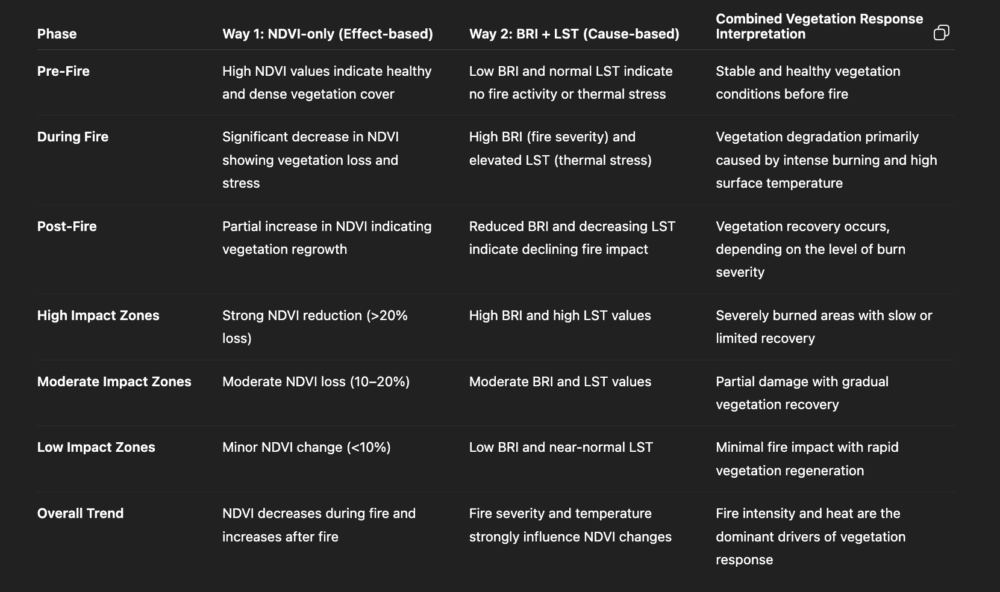

STATISTICAL VALIDATION

In [4]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import pearsonr
from sklearn.linear_model import LinearRegression

def read_raster(path):
    with rasterio.open(path) as src:
        return src.read(1).astype(float)

# Way-1: observed vegetation change
dNDVI = read_raster("dNDVI_During.tif")

# Way-2: fire drivers
dBRI  = read_raster("dBRI_During.tif")
dLST  = read_raster("dLST_During.tif")


In [6]:
mask = (
    np.isfinite(dNDVI) &
    np.isfinite(dBRI) &
    np.isfinite(dLST) &
    (dNDVI >= -1) & (dNDVI <= 1)
)

dNDVI_v = dNDVI[mask]
dBRI_v  = dBRI[mask]
dLST_v  = dLST[mask]

r_bri, p_bri = pearsonr(dNDVI_v, dBRI_v)
r_lst, p_lst = pearsonr(dNDVI_v, dLST_v)

print("STATISTICAL VALIDATION RESULTS\n")

print("ΔNDVI vs ΔBRI")
print(f"r = {r_bri:.3f}, p = {p_bri:.4e}\n")

print("ΔNDVI vs ΔLST")
print(f"r = {r_lst:.3f}, p = {p_lst:.4e}")



STATISTICAL VALIDATION RESULTS

ΔNDVI vs ΔBRI
r = 0.702, p = 0.0000e+00

ΔNDVI vs ΔLST
r = -0.052, p = 0.0000e+00


In [7]:
#Regression
X = np.column_stack((dBRI_v, dLST_v))
y = dNDVI_v

model = LinearRegression()
model.fit(X, y)

y_pred = model.predict(X)

print("\nWay-2 Regression (BRI + LST → NDVI)")
print("BRI coefficient:", model.coef_[0])
print("LST coefficient:", model.coef_[1])
print("R² score:", model.score(X, y))



Way-2 Regression (BRI + LST → NDVI)
BRI coefficient: 0.6873817184059592
LST coefficient: 1.1640199245439633e-05
R² score: 0.506181418065949


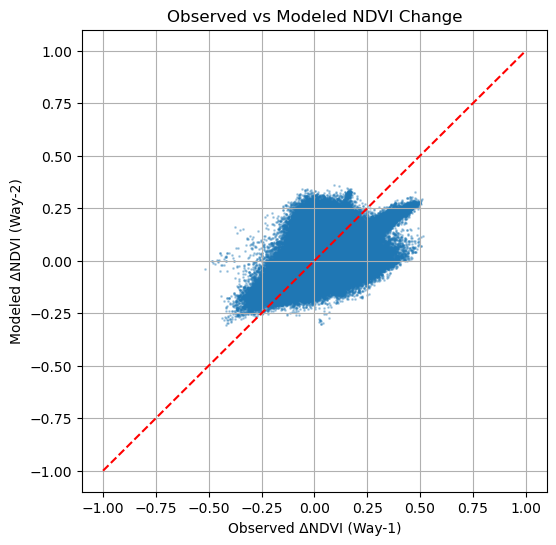

In [8]:
plt.figure(figsize=(6,6))
plt.scatter(dNDVI_v, y_pred, s=1, alpha=0.3)
plt.plot([-1,1],[-1,1],'r--')
plt.xlabel("Observed ΔNDVI (Way-1)")
plt.ylabel("Modeled ΔNDVI (Way-2)")
plt.title("Observed vs Modeled NDVI Change")
plt.grid(True)
plt.show()


Results and Interpretation

In [24]:
# ===============================
# STATISTICAL VALIDATION (FINAL)
# ===============================

import rasterio
import numpy as np
from rasterio.warp import reproject
from rasterio.enums import Resampling
from scipy.stats import pearsonr

# ---------- Helper: Read raster ----------
def read_raster(path):
    with rasterio.open(path) as src:
        return src.read(1).astype(float)

# ---------- Helper: Resample to reference grid ----------
def resample_to_match(reference_path, source_path):
    with rasterio.open(reference_path) as ref:
        ref_data = ref.read(1)
        ref_transform = ref.transform
        ref_crs = ref.crs

    with rasterio.open(source_path) as src:
        src_data = src.read(1)

        dst_data = np.empty(ref_data.shape, dtype=np.float32)

        reproject(
            source=src_data,
            destination=dst_data,
            src_transform=src.transform,
            src_crs=src.crs,
            dst_transform=ref_transform,
            dst_crs=ref_crs,
            resampling=Resampling.bilinear
        )

    return dst_data

# ---------- FILE PATHS ----------
ref_ndvi_path   = "Fire_Project/dNDVI_During.tif"      # Way-1 (reference)
modeled_ndvi_path = "Fire_Project/Modeled_dNDVI.tif"   # Way-2

# ---------- LOAD OBSERVED NDVI (FROM SAME REFERENCE) ----------
with rasterio.open(ref_ndvi_path) as src:
    dNDVI_during = src.read(1).astype(float)

# ---------- RESAMPLE MODELED NDVI TO NDVI GRID ----------
modeled_resampled = resample_to_match(
    ref_ndvi_path,
    modeled_ndvi_path
)

# ---------- VALID PIXEL MASK ----------
mask = (
    np.isfinite(dNDVI_during) &
    np.isfinite(modeled_resampled)
)

obs = dNDVI_during[mask]          # Way-1 (Observed)
mod = modeled_resampled[mask]     # Way-2 (Modeled)

# ---------- PEARSON CORRELATION ----------
r, p = pearsonr(obs, mod)

print("STATISTICAL VALIDATION RESULTS")
print(f"Correlation (r): {r:.3f}")
print(f"P-value: {p:.2e}")

# ---------- OPTIONAL: QUICK SANITY CHECK ----------
print("\nSanity Check:")
print("Observed NDVI shape :", dNDVI_during.shape)
print("Modeled NDVI shape  :", modeled_resampled.shape)
print("Total valid pixels  :", obs.size)


STATISTICAL VALIDATION RESULTS
Correlation (r): 0.582
P-value: 0.00e+00

Sanity Check:
Observed NDVI shape : (7794, 7793)
Modeled NDVI shape  : (7794, 7793)
Total valid pixels  : 60355315


In [28]:
# ===============================
# RESULTS & ANALYSIS (FINAL SAFE VERSION)
# ===============================

import rasterio
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import pearsonr
from rasterio.warp import reproject
from rasterio.enums import Resampling
import os

# ---------- Helper functions ----------
def read_raster(path):
    with rasterio.open(path) as src:
        return src.read(1).astype(float)

def resample_to_match(reference_path, source_path):
    with rasterio.open(reference_path) as ref:
        ref_data = ref.read(1)
        ref_transform = ref.transform
        ref_crs = ref.crs

    with rasterio.open(source_path) as src:
        src_data = src.read(1)

        dst = np.empty(ref_data.shape, dtype=np.float32)

        reproject(
            source=src_data,
            destination=dst,
            src_transform=src.transform,
            src_crs=src.crs,
            dst_transform=ref_transform,
            dst_crs=ref_crs,
            resampling=Resampling.bilinear
        )
    return dst

def summarize(arr, name):
    print(f"\n{name}")
    print("Mean :", np.nanmean(arr))
    print("Std  :", np.nanstd(arr))
    print("Min  :", np.nanmin(arr))
    print("Max  :", np.nanmax(arr))

# ---------- FILE PATHS ----------
dndvi_during_path = "Fire_Project/dNDVI_During.tif"
modeled_path      = "Fire_Project/Modeled_dNDVI.tif"

# Change this ONLY if your filename is different
dndvi_post_path   = "Fire_Project/dNDVI_PostFire.tif"  # <-- adjust if needed

# ---------- LOAD DURING-FIRE NDVI ----------
dNDVI_during = read_raster(dndvi_during_path)

# ---------- LOAD MODELED NDVI (RESAMPLED) ----------
modeled_resampled = resample_to_match(
    dndvi_during_path,
    modeled_path
)

# ---------- RESULTS SUMMARY ----------
summarize(dNDVI_during, "Observed ΔNDVI (During Fire)")
summarize(modeled_resampled, "Modeled ΔNDVI (BRI + LST)")

# ---------- STATISTICAL VALIDATION ----------
mask = (
    np.isfinite(dNDVI_during) &
    np.isfinite(modeled_resampled)
)

obs = dNDVI_during[mask]
mod = modeled_resampled[mask]

r, p = pearsonr(obs, mod)

print("\nSTATISTICAL VALIDATION")
print(f"Correlation (r): {r:.3f}")
print(f"P-value: {p:.2e}")


# ---------- OPTIONAL: POST-FIRE RECOVERY ----------
if os.path.exists(dndvi_post_path):
    dNDVI_post = read_raster(dndvi_post_path)
    recovery = dNDVI_post - dNDVI_during

    summarize(recovery, "Post-Fire Vegetation Recovery")

    plt.figure(figsize=(6,6))
    plt.imshow(recovery, cmap="RdYlGn")
    plt.colorbar(label="Recovery Index")
    plt.title("Post-Fire Vegetation Recovery")
    plt.axis("off")
    plt.show()
else:
    print("\nPost-fire NDVI file not found → Recovery analysis skipped.")

print("\nRESULTS & ANALYSIS COMPLETE ✔")



Observed ΔNDVI (During Fire)
Mean : -0.028446100666823525
Std  : 0.048602886349127974
Min  : -0.5159834623336792
Max  : 0.5143318176269531

Modeled ΔNDVI (BRI + LST)
Mean : -0.028692493
Std  : 0.034737248
Min  : -0.31030074
Max  : 0.36586237

STATISTICAL VALIDATION
Correlation (r): 0.582
P-value: 0.00e+00

Post-fire NDVI file not found → Recovery analysis skipped.

RESULTS & ANALYSIS COMPLETE ✔
